# <div style="text-align: center"><font color='gray' textalign='center'>Lab 1: Data Profilling</font></div>

In [1]:
import pandas as pd
import ds_functions as ds
import matplotlib.pyplot as plt

data = pd.read_csv('qsar_oral_toxicity.csv', sep = ';', header = None)

data

,0,1,2,3,4,5,6,7,8,9,...,1015,1016,1017,1018,1019,1020,1021,1022,1023,1024
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,negative
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,negative
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,negative
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,negative
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8987,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,negative
8988,0,1,0,0,0,1,0,1,0,0,...,0,0,0,1,0,0,0,0,0,negative
8989,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,negative
8990,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,negative


## <font color='gray'> Data Dimensionality </font>

In [2]:
data.shape

(8992, 1025)

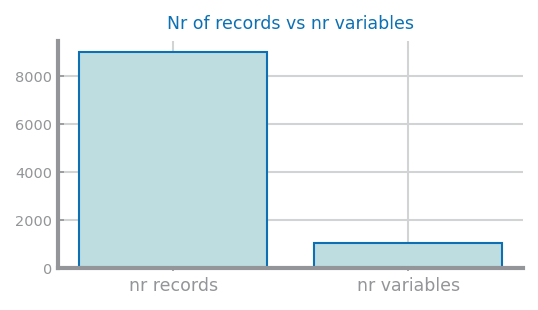

In [3]:
plt.figure(figsize=(4,2))
values = {'nr records': data.shape[0], 'nr variables': data.shape[1]}
ds.bar_chart(values.keys(), values.values(), title='Nr of records vs nr variables')

## <font color='gray'> Variables Type </font>

In [4]:
data.dtypes

0        int64
1        int64
2        int64
3        int64
4        int64
         ...  
1020     int64
1021     int64
1022     int64
1023     int64
1024    object
Length: 1025, dtype: object

In [5]:
for col in data.select_dtypes(include = "int64"):
    data[col] = data[col].astype(bool)

cat_vars = data.select_dtypes(include='object')
data[cat_vars.columns] = data.select_dtypes(['object']).apply(lambda x: x.astype('category'))
data.dtypes

0           bool
1           bool
2           bool
3           bool
4           bool
          ...   
1020        bool
1021        bool
1022        bool
1023        bool
1024    category
Length: 1025, dtype: object

## <font color='gray'> Missing Values </font>

In [6]:
mv = {}
for var in data:
    mv[var] = data[var].isna().sum()
mv.values()

dict_values([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

## <font color='gray'> Data Distribution - Symbolic Variables</font>

In [7]:
data.describe(include=["bool", "category"])

,0,1,2,3,4,5,6,7,8,9,...,1015,1016,1017,1018,1019,1020,1021,1022,1023,1024
count,8992,8992,8992,8992,8992,8992,8992,8992,8992,8992,...,8992,8992,8992,8992,8992,8992,8992,8992,8992,8992
unique,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
top,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,negative
freq,7077,8671,8374,8692,8824,7690,7885,7250,8868,8836,...,8441,8842,7514,6843,8790,8794,8796,8791,8826,8251


In [8]:
symbolic_vars = data.select_dtypes(include = ["bool", "category"]).columns

for var in symbolic_vars:
    print(var, data[var].unique())

0 [False  True]
1 [False  True]
2 [False  True]
3 [False  True]
4 [False  True]
5 [False  True]
6 [False  True]
7 [False  True]
8 [False  True]
9 [False  True]
10 [ True False]
11 [False  True]
12 [False  True]
13 [False  True]
14 [False  True]
15 [False  True]
16 [ True False]
17 [False  True]
18 [False  True]
19 [False  True]
20 [False  True]
21 [False  True]
22 [False  True]
23 [False  True]
24 [False  True]
25 [False  True]
26 [False  True]
27 [False  True]
28 [False  True]
29 [False  True]
30 [False  True]
31 [False  True]
32 [False  True]
33 [False  True]
34 [False  True]
35 [False  True]
36 [False  True]
37 [False  True]
38 [False  True]
39 [False  True]
40 [ True False]
41 [False  True]
42 [False  True]
43 [False  True]
44 [False  True]
45 [False  True]
46 [False  True]
47 [False  True]
48 [False  True]
49 [False  True]
50 [False  True]
51 [False  True]
52 [False  True]
53 [False  True]
54 [False  True]
55 [False  True]
56 [False  True]
57 [False  True]
58 [False  True]
59 [Fal

516 [False  True]
517 [False  True]
518 [False  True]
519 [False  True]
520 [False  True]
521 [False  True]
522 [False  True]
523 [False  True]
524 [False  True]
525 [False  True]
526 [False  True]
527 [False  True]
528 [False  True]
529 [False  True]
530 [False  True]
531 [False  True]
532 [False  True]
533 [False  True]
534 [False  True]
535 [False  True]
536 [False  True]
537 [False  True]
538 [False  True]
539 [False  True]
540 [False  True]
541 [False  True]
542 [False  True]
543 [False  True]
544 [False  True]
545 [False  True]
546 [False  True]
547 [False  True]
548 [False  True]
549 [False  True]
550 [False  True]
551 [False  True]
552 [False  True]
553 [False  True]
554 [False  True]
555 [False  True]
556 [False  True]
557 [ True False]
558 [False  True]
559 [False  True]
560 [False  True]
561 [False  True]
562 [False  True]
563 [False  True]
564 [False  True]
565 [False  True]
566 [False  True]
567 [False  True]
568 [False  True]
569 [ True False]
570 [False  True]
571 [False

In [9]:
rows, cols = ds.choose_grid(257)
fig, axs = plt.subplots(rows, cols, figsize=(cols*ds.HEIGHT, rows*ds.HEIGHT), squeeze=False)
i, j = 0, 0
for n in range(257):
    counts = data[symbolic_vars[n+257*0]].value_counts()
    ds.bar_chart(list(map(str, counts.index.to_list())), counts.values, ax=axs[i, j], title='Histogram for %s'%symbolic_vars[n+257*0],
                 xlabel=symbolic_vars[n+257*0], ylabel='nr records')
    i, j = (i + 1, 0) if (n+1) % cols == 0 else (i, j + 1)
plt.show()

In [10]:
rows, cols = ds.choose_grid(257)
fig, axs = plt.subplots(rows, cols, figsize=(cols*ds.HEIGHT, rows*ds.HEIGHT), squeeze=False)
i, j = 0, 0
for n in range(257):
    counts = data[symbolic_vars[n+257*1]].value_counts()
    ds.bar_chart(list(map(str, counts.index.to_list())), counts.values, ax=axs[i, j], title='Histogram for %s'%symbolic_vars[n+257*1],
                 xlabel=symbolic_vars[n+257*1], ylabel='nr records')
    i, j = (i + 1, 0) if (n+1) % cols == 0 else (i, j + 1)
plt.show()

In [11]:
rows, cols = ds.choose_grid(257)
fig, axs = plt.subplots(rows, cols, figsize=(cols*ds.HEIGHT, rows*ds.HEIGHT), squeeze=False)
i, j = 0, 0
for n in range(257):
    counts = data[symbolic_vars[n+257*2]].value_counts()
    ds.bar_chart(list(map(str, counts.index.to_list())), counts.values, ax=axs[i, j], title='Histogram for %s'%symbolic_vars[n+257*2],
                 xlabel=symbolic_vars[n+257*2], ylabel='nr records')
    i, j = (i + 1, 0) if (n+1) % cols == 0 else (i, j + 1)
plt.show()

In [12]:
rows, cols = ds.choose_grid(257)
fig, axs = plt.subplots(rows, cols, figsize=(cols*ds.HEIGHT, rows*ds.HEIGHT), squeeze=False)
i, j = 0, 0
for n in range(254):
    counts = data[symbolic_vars[n+257*3]].value_counts()
    ds.bar_chart(list(map(str, counts.index.to_list())), counts.values, ax=axs[i, j], title='Histogram for %s'%symbolic_vars[n+257*3],
                 xlabel=symbolic_vars[n+257*3], ylabel='nr records')
    i, j = (i + 1, 0) if (n+1) % cols == 0 else (i, j + 1)
plt.show()

## <font color='gray'> Sparsity</font>

In [13]:
import pandas as pd

data = pd.read_csv('qsar_oral_toxicity.csv', sep = ';', header = None)

for i in range(len(data)):
    if(data[1024][i] == 'negative'):
        data[1024][i] = 0
    else:
        data[1024][i] = 1
data[1024] = data[1024].astype("int")

corr_mtx = data.corr()

In [14]:
print(corr_mtx)

          0         1         2         3         4         5         6     \
0     1.000000 -0.022492 -0.042534  0.027393 -0.007580 -0.029552  0.025832   
1    -0.022492  1.000000 -0.009623  0.017658  0.000012  0.210397  0.041014   
2    -0.042534 -0.009623  1.000000 -0.016200 -0.001773 -0.039329  0.007918   
3     0.027393  0.017658 -0.016200  1.000000  0.038395  0.013307  0.026514   
4    -0.007580  0.000012 -0.001773  0.038395  1.000000  0.036584  0.028291   
...        ...       ...       ...       ...       ...       ...       ...   
1020  0.034860 -0.004363  0.007165  0.001663  0.001683  0.007173  0.068329   
1021 -0.027423  0.020537 -0.013458  0.001954  0.013151  0.068435  0.057650   
1022 -0.012507  0.060108  0.012447  0.001232 -0.004197 -0.008773  0.023480   
1023  0.112294  0.013688  0.014993  0.038928  0.066497  0.110260  0.144742   
1024 -0.045251  0.022991  0.062461  0.072691 -0.008495 -0.038263 -0.011354   

          7         8         9     ...      1015      1016    

In [15]:
corr = []

for diag in range(len(corr_mtx)):
    for row in range(len(corr_mtx[0]) - diag):
        col = row + diag
        if corr_mtx[row][col] > 0.95 and col != row:
            corr.append([row, col, corr_mtx[row][col]])

corr.sort()

unique = []

for i in range(len(corr)):
    print("Variables: ", corr[i][0], ", ", corr[i][1], "\tCorrelation: ", corr[i][2])
    if corr[i][0] not in unique:
        unique.append(corr[i][0])
    if corr[i][1] not in unique:
        unique.append(corr[i][1])

unique.append(1024)
unique.sort()

Variables:  46 ,  53 	Correlation:  0.9552507102258118
Variables:  78 ,  646 	Correlation:  0.9553304410243406
Variables:  78 ,  685 	Correlation:  0.9517703070120606
Variables:  78 ,  758 	Correlation:  0.9597882731748477
Variables:  78 ,  871 	Correlation:  0.9565731427472126
Variables:  116 ,  408 	Correlation:  0.9670285739309806
Variables:  178 ,  405 	Correlation:  0.9693883313679609
Variables:  260 ,  683 	Correlation:  0.9725042448616831
Variables:  288 ,  960 	Correlation:  0.9702266875318708
Variables:  349 ,  424 	Correlation:  0.9649658519920675
Variables:  383 ,  657 	Correlation:  0.9509206442993228
Variables:  414 ,  759 	Correlation:  0.9814857524708862
Variables:  456 ,  819 	Correlation:  0.970810129324593
Variables:  465 ,  656 	Correlation:  0.9571695995828282
Variables:  467 ,  473 	Correlation:  0.9606072008147081
Variables:  646 ,  685 	Correlation:  0.9544610549095189
Variables:  646 ,  758 	Correlation:  0.9696762043743149
Variables:  646 ,  871 	Correlation:  

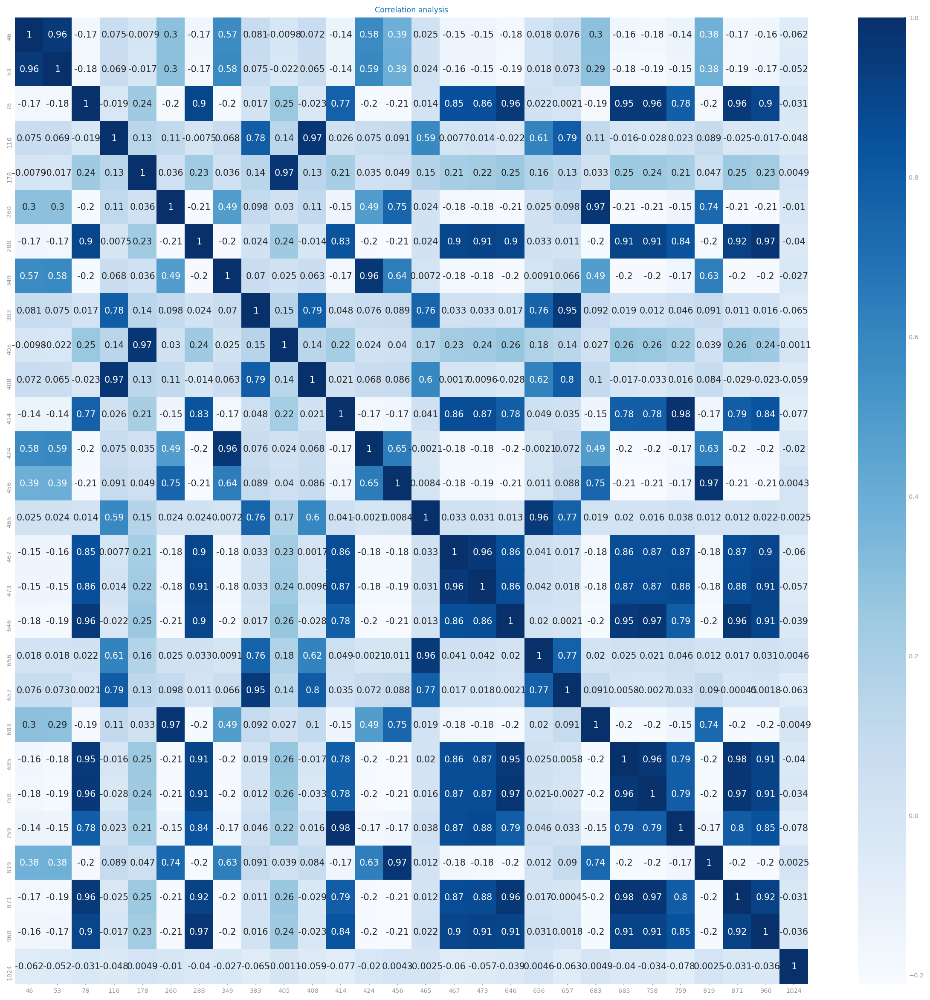

In [16]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

high_data = data[unique].corr()

fig = plt.figure(figsize=[20, 20])
#annot a false e com 100 variaveis. comparar com a variavel target
sns.heatmap(high_data, xticklabels=high_data.columns, yticklabels=high_data.columns, annot=True, cmap='Blues')
plt.title('Correlation analysis')
plt.show()